Цель: Боевой проект по тематическому моделированию. 

Цель - построить LDA модель и получить интерпретируемые топики. Попробовать посчитать тематические профили и получить их визуализацию на двумерной плоскости при помощи TSNE
В материалах вы можете найти выгрузку комментариев из разных музыкальных групп ВК, в полях music_style и performer можно получить информацию о конкретном музыкальном жанре и исполнителе, в группе которого был написан комментарий. Выгрузка уменьшенная, остались только комментарии длиной больше 40 слов, но тем не менее это всё ещё 500Мб, так что модельки будут считаться долго. Для отладки рекомендую брать небольшую выборку из этого датасета, чтобы на ней тестировать свой код. 

Если у вас есть собственный датасет - можно (и будет очень круто) использовать его :)

1. Загрузите датасет. Если используете данные вк, то после загрузки воспользуйтесь следующим кодом:

from ast import literal_eval
bag_of_words = data.text_bow.apply(literal_eval)

где data - это загруженный датасет. Операция необходима, так как предварительно уже была проведена предобработка текстов и получено представление bag-of-words, так что остаётся его лишь прочитать из датасета

2. Используя gensim, добавьте биграммы к имеющемуся bag_of_words представлению

3. Составьте словарь из терминов (corpora.Dictionary) 

4. По словарю терминов при помощи метода filter_extremes проведите фильтрацию слов по частоте встречаемости. На данных вк рекомендую следующие параметры: (no_below=3, no_above=0.4, keep_n=3*10**6)

5. Наконец, составьте итоговый корпус документов при помощи метода doc2bow. Рекомендую его сохранить (например, в pickle формате), на случай, если что-то где-то пойдет не так

6. По получившемуся корпусу постройте LDA модель, если используете данные вк, рекомендую параметры (eval_every=20, num_topics=30, passes=5). Не забудьте сохранить саму модель и её аттрибут expElogBeta, также при помощи метода show_topics возьмите по 100 самых вероятных слов для каждой темы

7. При помощи wordcloud визуализируйте каждый из получившихся топиков и попробуйте их проинтерпретировать. Чтобы не возиться долго с функциями для визуализации, можно взять их отсюда - https://github.com/DmitrySerg/top-russian-music/blob/master/models/clean_visualization.ipynb

8. Наконец, постройте тематические профили по интересующим вас группировкам (в случае с вк можно построить средние тематические вектора по жанрам или по исполнителям, если у вас собственные данные, попробуйте подумать, как можно было бы сгруппировать ваши документы, чтобы все-таки построить профили групп), и визуализируйте их при помощи TSNE

9. Вы великолепны


In [150]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ast import literal_eval 

from gensim import corpora, models, utils
import pickle

from pymystem3 import Mystem
import re
from nltk.corpus import stopwords
stop_words = stopwords.words('russian')

import matplotlib.pyplot as plt
import seaborn as sns 

from MulticoreTSNE import MulticoreTSNE

import matplotlib.pyplot as plt


In [2]:
data = pd.read_csv('news_from_vestiru_2019.csv')
data


,Unnamed: 0,title,description,keywords_text,time_post,base_text
0,0,Во время новогодних каникул в России вступят в...,С наступлением Нового года в России в силу вст...,"['новые', 'законы', '2019', 'год', 'НДС', 'акц...",1 января 2019 23:31,С наступлением Нового года в России в силу вст...
1,1,Путин продлил на 2 года надзорные каникулы для...,Президент России Владимир Путин подписал закон...,"['Путин', 'закон', 'экономика', 'надзорные', '...",1 января 2019 12:59,Президент России Владимир Путин подписал закон...
2,2,Рекорды российской экономики в 2018 году,Прошедший год оказался достаточно сложным не т...,NaN,1 января 2019 11:45,"Москва, 31 декабря - ""Вести.Экономика"". Прошед..."
3,3,В России вступил в силу закон о льготах для гр...,С 1 января в Российской Федерации вступил в си...,"['пенсионер', 'льгота', 'налог']",1 января 2019 11:25,С 1 января в Российской Федерации вступил в си...
4,4,"С 1 января выросли тарифы ЖКХ, ставка НДС и ак...",С 1 января 2019 года в силу вступают сразу нес...,"['россия', 'налог', 'ставка', 'ндс', 'бюджет',...",1 января 2019 10:48,С 1 января 2019 года в силу вступают сразу нес...
...,...,...,...,...,...,...
18828,18828,Россияне получат цифровое право разрешать или ...,"Новый порядок, позволяющий россиянам давать в ...",NaN,11 декабря 2019 13:29,"Москва, 11 декабря - ""Вести.Экономика"". Новый ..."
18829,18829,Перевозка пассажиров по железным дорогам Росси...,РЖД в 2019 г. перевезут рекордное количество п...,NaN,11 декабря 2019 13:17,"Москва, 11 декабря - ""Вести.Экономика"". РЖД в ..."
18830,18830,Уход от доллара США требует перестройки мирово...,Уход от доллара США в расчетах - процесс небыс...,NaN,11 декабря 2019 12:53,"Москва, 11 декабря - ""Вести.Экономика"". Уход о..."
18831,18831,"Росфинмониторинг закрыл 25 ""прачечных""",Федеральная служба по финансовому мониторингу ...,NaN,11 декабря 2019 12:49,"Москва, 11 декабря - ""Вести.Экономика"". Федера..."


In [3]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18833 entries, 0 to 18832
Data columns (total 6 columns):
Unnamed: 0       18833 non-null int64
title            18833 non-null object
description      18833 non-null object
keywords_text    2147 non-null object
time_post        18833 non-null object
base_text        18832 non-null object
dtypes: int64(1), object(5)
memory usage: 882.9+ KB


In [4]:
data.drop('Unnamed: 0', axis = 1, inplace = True)
data


,title,description,keywords_text,time_post,base_text
0,Во время новогодних каникул в России вступят в...,С наступлением Нового года в России в силу вст...,"['новые', 'законы', '2019', 'год', 'НДС', 'акц...",1 января 2019 23:31,С наступлением Нового года в России в силу вст...
1,Путин продлил на 2 года надзорные каникулы для...,Президент России Владимир Путин подписал закон...,"['Путин', 'закон', 'экономика', 'надзорные', '...",1 января 2019 12:59,Президент России Владимир Путин подписал закон...
2,Рекорды российской экономики в 2018 году,Прошедший год оказался достаточно сложным не т...,NaN,1 января 2019 11:45,"Москва, 31 декабря - ""Вести.Экономика"". Прошед..."
3,В России вступил в силу закон о льготах для гр...,С 1 января в Российской Федерации вступил в си...,"['пенсионер', 'льгота', 'налог']",1 января 2019 11:25,С 1 января в Российской Федерации вступил в си...
4,"С 1 января выросли тарифы ЖКХ, ставка НДС и ак...",С 1 января 2019 года в силу вступают сразу нес...,"['россия', 'налог', 'ставка', 'ндс', 'бюджет',...",1 января 2019 10:48,С 1 января 2019 года в силу вступают сразу нес...
...,...,...,...,...,...
18828,Россияне получат цифровое право разрешать или ...,"Новый порядок, позволяющий россиянам давать в ...",NaN,11 декабря 2019 13:29,"Москва, 11 декабря - ""Вести.Экономика"". Новый ..."
18829,Перевозка пассажиров по железным дорогам Росси...,РЖД в 2019 г. перевезут рекордное количество п...,NaN,11 декабря 2019 13:17,"Москва, 11 декабря - ""Вести.Экономика"". РЖД в ..."
18830,Уход от доллара США требует перестройки мирово...,Уход от доллара США в расчетах - процесс небыс...,NaN,11 декабря 2019 12:53,"Москва, 11 декабря - ""Вести.Экономика"". Уход о..."
18831,"Росфинмониторинг закрыл 25 ""прачечных""",Федеральная служба по финансовому мониторингу ...,NaN,11 декабря 2019 12:49,"Москва, 11 декабря - ""Вести.Экономика"". Федера..."


In [5]:
data['base_text'][18829]


'Москва, 11 декабря - "Вести.Экономика". РЖД в 2019 г. перевезут рекордное количество пассажиров - 1,2 млрд пассажиров. Это максимум за последние 11 лет, заявил гендиректор компании Олег Белозеров на правлении РЖД.Фото: ТАСС "По итогам 2019 г. будет отправлено 1,2 млрд пассажиров. Это самый высокий показатель за последние 11 лет, - заявил Белозеров. - Хочу подчеркнуть, что эти результаты получены в условиях высокой сравнительной базы 2018 г., когда проводился чемпионат мира по футболу".В 2020 г. РЖД планирует увеличить перевозку пассажиров на 4%.Перевозки пассажиров в сети РЖД в 2018 г. выросли на 3,4% до 1,155 млрд пассажиров, сообщали "Вести. Экономика". В январе-ноябре 2019 г. РЖД увеличили перевозку пассажиров на 3,7% по сравнению с аналогичным периодом предыдущего года - 1,1 млрд человек.В дальнем следовании перевезено 110 млн пассажиров (+7,9%), в пригородном сообщении – 1 млрд 45 млн пассажиров (+2,9%).Пассажирооборот на сети ОАО "РЖД" в 2018 г. вырос на 5,2% к уровню предыдущег

In [154]:
data['base_text'] = data['base_text'].astype('str').dropna()


In [7]:
df = data['base_text'].values.tolist()
len(df)


18833

In [87]:
def month(i):
    return i.split(' ')[1]

data['month'] = data['time_post'].map(month)


In [155]:
data


,title,description,keywords_text,time_post,base_text,month
0,Во время новогодних каникул в России вступят в...,С наступлением Нового года в России в силу вст...,"['новые', 'законы', '2019', 'год', 'НДС', 'акц...",1 января 2019 23:31,С наступлением Нового года в России в силу вст...,января
1,Путин продлил на 2 года надзорные каникулы для...,Президент России Владимир Путин подписал закон...,"['Путин', 'закон', 'экономика', 'надзорные', '...",1 января 2019 12:59,Президент России Владимир Путин подписал закон...,января
2,Рекорды российской экономики в 2018 году,Прошедший год оказался достаточно сложным не т...,NaN,1 января 2019 11:45,"Москва, 31 декабря - ""Вести.Экономика"". Прошед...",января
3,В России вступил в силу закон о льготах для гр...,С 1 января в Российской Федерации вступил в си...,"['пенсионер', 'льгота', 'налог']",1 января 2019 11:25,С 1 января в Российской Федерации вступил в си...,января
4,"С 1 января выросли тарифы ЖКХ, ставка НДС и ак...",С 1 января 2019 года в силу вступают сразу нес...,"['россия', 'налог', 'ставка', 'ндс', 'бюджет',...",1 января 2019 10:48,С 1 января 2019 года в силу вступают сразу нес...,января
...,...,...,...,...,...,...
18828,Россияне получат цифровое право разрешать или ...,"Новый порядок, позволяющий россиянам давать в ...",NaN,11 декабря 2019 13:29,"Москва, 11 декабря - ""Вести.Экономика"". Новый ...",декабря
18829,Перевозка пассажиров по железным дорогам Росси...,РЖД в 2019 г. перевезут рекордное количество п...,NaN,11 декабря 2019 13:17,"Москва, 11 декабря - ""Вести.Экономика"". РЖД в ...",декабря
18830,Уход от доллара США требует перестройки мирово...,Уход от доллара США в расчетах - процесс небыс...,NaN,11 декабря 2019 12:53,"Москва, 11 декабря - ""Вести.Экономика"". Уход о...",декабря
18831,"Росфинмониторинг закрыл 25 ""прачечных""",Федеральная служба по финансовому мониторингу ...,NaN,11 декабря 2019 12:49,"Москва, 11 декабря - ""Вести.Экономика"". Федера...",декабря


In [8]:
# Remove new line characters
df = [re.sub('\s+', ' ', str(sent)) for sent in df]
# Remove distracting single quotes
df = [re.sub("\'", "", str(sent)) for sent in df]


In [9]:
# Некоторые тексты начинаются в подобном стиле "Москва, 11 декабря - "Вести.Экономика"". Удалим это:
df_preproc = [] 
for i in df:
    if 'Вести.Экономика' in i:
        df_preproc.append(str(i.split('Вести.Экономика')[1]).strip())
    else:
        df_preproc.append(i)
df_preproc[-1]


'". Оборот трансграничных денежных переводов из России может сократиться в 2019 г. на 7,5% до $44,3 млрд из-за введения лимитов на отправку денег и сокращения потока мигрантов, отмечено в исследовании "Сколково" и его резидента - VR_Bank. В исследовании изучены восемь систем денежных переводов - "Золотая Корона", "Юнистрим", Western Union, Contact, "Сбербанк России Колибри (Блиц)", Blizko, "Бэст", "АзияЭкспресс". Первые три системы - "Золотая Корона", "Юнистрим" и Western Union - дальше других продвинулись с точки зрения цифровизации бизнеса."Оценивая степень цифровизации их бизнеса, мы пришли к выводу, что через 3-5 лет на российском рынке останется не более трех компаний. Именно они показали наилучшие результаты по различным критериям рейтинга", - полагает VR_Bank. На сокращение количества переводов повлияло введение ограничений на отправку денег во Вьетнам, Китай, Киргизию и Казахстан, сокращение потока мигрантов в Россию, давление со стороны банков и операторов моментальных платеже

In [10]:
df_1 = [re.sub(r'[^\w\s]', '', text) for text in df_preproc]


In [11]:
%%time
m = Mystem()

df_2 = [''.join(m.lemmatize(text)).strip() for text in df_1]
df_2[0]


CPU times: user 27.3 s, sys: 1.5 s, total: 28.8 s
Wall time: 5min 40s


'с наступление новый год в россия в сила вступать почти полсотни новый закон в тот число тот который касаться налог и социальный выплата во время длинный новогодний каникулы вступать в сила около пятьдесят новый закон 1 январь минимальный размер оплата труд увеличиваться до 11 тысяча 280 рубль также вырастать максимальный размер пособие по беременность и род и ежемесячный пособие по уход за ребенок до полтора год человек предпенсионный возраст  это женщина с 55 год и мужчина с 60 год  отныне не быть платить налог на дом квартира или гараж в 2019 год повышаться ставка ндс с 18 до 20 процент это не касаться товар социальный назначение а также лекарство который облагаться налог по льготный ставка на 10 процент вырастать акциз на сигарета тариф жкх прибавлять 17 процент вступать в сила долгожданный изменение для дачник теперь на садовый участок можно строить жилой дом и получать в они прописка а пенсионный фонд начинать внедрять новый технология  цифровой социальный карта пенсионер передав

In [12]:
%%time
def sent_to_words(texts):
    for text in texts:
        yield(utils.simple_preprocess(str(text), deacc = True))

data_words = list(sent_to_words(df_2))
print(data_words[:2])


[['наступление', 'новыи', 'год', 'россия', 'сила', 'вступать', 'почти', 'полсотни', 'новыи', 'закон', 'тот', 'число', 'тот', 'которыи', 'касаться', 'налог', 'социальныи', 'выплата', 'во', 'время', 'длинныи', 'новогоднии', 'каникулы', 'вступать', 'сила', 'около', 'пятьдесят', 'новыи', 'закон', 'январь', 'минимальныи', 'размер', 'оплата', 'труд', 'увеличиваться', 'до', 'тысяча', 'рубль', 'также', 'вырастать', 'максимальныи', 'размер', 'пособие', 'по', 'беременность', 'род', 'ежемесячныи', 'пособие', 'по', 'уход', 'за', 'ребенок', 'до', 'полтора', 'год', 'человек', 'предпенсионныи', 'возраст', 'это', 'женщина', 'год', 'мужчина', 'год', 'отныне', 'не', 'быть', 'платить', 'налог', 'на', 'дом', 'квартира', 'или', 'гараж', 'год', 'повышаться', 'ставка', 'ндс', 'до', 'процент', 'это', 'не', 'касаться', 'товар', 'социальныи', 'назначение', 'также', 'лекарство', 'которыи', 'облагаться', 'налог', 'по', 'льготныи', 'ставка', 'на', 'процент', 'вырастать', 'акциз', 'на', 'сигарета', 'тариф', 'жкх', 

In [13]:
%%time
bigram = models.Phrases(data_words, min_count = 3, threshold = 10)


CPU times: user 15.1 s, sys: 516 ms, total: 15.7 s
Wall time: 16.2 s


In [14]:
%%time
bigram_mod = models.phrases.Phraser(bigram)


CPU times: user 42.8 s, sys: 1.17 s, total: 44 s
Wall time: 48.3 s


In [15]:
data_words[2]

['прошедшии',
 'год',
 'оказываться',
 'достаточно',
 'сложныи',
 'не',
 'только',
 'для',
 'экономика',
 'россия',
 'но',
 'для',
 'весь',
 'мир',
 'то',
 'не',
 'менее',
 'наш',
 'страна',
 'запоминаться',
 'некоторыи',
 'рекорд',
 'тотальныи',
 'ликвидация',
 'один',
 'из',
 'самыи',
 'запоминаться',
 'событие',
 'уходить',
 'год',
 'становиться',
 'избавление',
 'россия',
 'от',
 'американскии',
 'гособлигация',
 'апрель',
 'главныи',
 'продавец',
 'трежерис',
 'выступать',
 'россия',
 'которыи',
 'избавляться',
 'от',
 'рекордныи',
 'объем',
 'американскии',
 'облигация',
 'сокращать',
 'свои',
 'вложение',
 'они',
 'два',
 'раз',
 'быть',
 'продавать',
 'бумага',
 'на',
 'млрд',
 'по',
 'итог',
 'апрель',
 'россиискии',
 'инвестиция',
 'трежерис',
 'составлять',
 'млрд',
 'самыи',
 'низкии',
 'показатель',
 'zerohedge',
 'маи',
 'основныи',
 'продавец',
 'снова',
 'становиться',
 'наш',
 'страна',
 'более',
 'то',
 'это',
 'можно',
 'смело',
 'называть',
 'тотальныи',
 'ликвидаци

In [16]:
%%time
stop_words = stop_words + ['мочь', 'свои', 'все', 'наш', 'которыи', 'это', 'весь', 'день', 'неделя', 'месяц', 'квартал', 
                           'твои', 'тыс', 'млрд', 'млн', 'трлн', 'гг', 'руб']

def remove_stopwords(texts):
    return [[word for word in doc if word not in stop_words] for doc in texts]

data_no_stop_words = remove_stopwords(data_words)
data_no_stop_words[2]


CPU times: user 9 s, sys: 128 ms, total: 9.13 s
Wall time: 9.2 s


['прошедшии',
 'год',
 'оказываться',
 'достаточно',
 'сложныи',
 'экономика',
 'россия',
 'мир',
 'менее',
 'страна',
 'запоминаться',
 'некоторыи',
 'рекорд',
 'тотальныи',
 'ликвидация',
 'самыи',
 'запоминаться',
 'событие',
 'уходить',
 'год',
 'становиться',
 'избавление',
 'россия',
 'американскии',
 'гособлигация',
 'апрель',
 'главныи',
 'продавец',
 'трежерис',
 'выступать',
 'россия',
 'избавляться',
 'рекордныи',
 'объем',
 'американскии',
 'облигация',
 'сокращать',
 'вложение',
 'продавать',
 'бумага',
 'итог',
 'апрель',
 'россиискии',
 'инвестиция',
 'трежерис',
 'составлять',
 'самыи',
 'низкии',
 'показатель',
 'zerohedge',
 'маи',
 'основныи',
 'продавец',
 'снова',
 'становиться',
 'страна',
 'смело',
 'называть',
 'тотальныи',
 'ликвидация',
 'вложение',
 'трежерис',
 'упасть',
 'напоминать',
 'начало',
 'год',
 'показатель',
 'составлять',
 'примерно',
 'остальнои',
 'серьезныи',
 'изменение',
 'золотои',
 'рекорд',
 'вместе',
 'россия',
 'продолжать',
 'агрессивн

In [17]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

data_words_bigrams = make_bigrams(data_no_stop_words)


In [18]:
data_words_bigrams[2]


['прошедшии_год',
 'оказываться_достаточно',
 'сложныи',
 'экономика',
 'россия',
 'мир',
 'менее',
 'страна',
 'запоминаться',
 'некоторыи',
 'рекорд',
 'тотальныи',
 'ликвидация',
 'самыи',
 'запоминаться',
 'событие',
 'уходить',
 'год',
 'становиться',
 'избавление',
 'россия',
 'американскии_гособлигация',
 'апрель',
 'главныи',
 'продавец',
 'трежерис',
 'выступать',
 'россия',
 'избавляться',
 'рекордныи_объем',
 'американскии',
 'облигация',
 'сокращать_вложение',
 'продавать_бумага',
 'итог',
 'апрель',
 'россиискии',
 'инвестиция',
 'трежерис',
 'составлять',
 'самыи_низкии',
 'показатель',
 'zerohedge',
 'маи',
 'основныи',
 'продавец',
 'снова',
 'становиться',
 'страна',
 'смело_называть',
 'тотальныи',
 'ликвидация',
 'вложение_трежерис',
 'упасть',
 'напоминать',
 'начало',
 'год',
 'показатель',
 'составлять',
 'примерно',
 'остальнои',
 'серьезныи_изменение',
 'золотои',
 'рекорд',
 'вместе',
 'россия',
 'продолжать',
 'агрессивныи',
 'скупать_золото',
 'центральныи_ба

In [19]:
%%time

# Создаем словарь из всех слов
dictionary = corpora.Dictionary(data_words_bigrams)


CPU times: user 6.14 s, sys: 76.9 ms, total: 6.22 s
Wall time: 6.27 s


In [20]:
# no_below - слишком редкие слова, no_above = слишком частые
dictionary.filter_extremes(no_below = 5, no_above = 0.5, keep_n = 3 * 10**6)


In [21]:
# Составляем готовый корпус:
corpus = [dictionary.doc2bow(text) for text in data_words_bigrams]


In [22]:
with open('corpus', 'wb') as f:
    pickle.dump(corpus, f)


In [49]:
%%time
ldamodel = models.ldamodel.LdaModel(
    corpus = corpus,
    id2word = dictionary,
    eval_every = 20,
    num_topics = 40,
    passes = 5
)


CPU times: user 11min 12s, sys: 16.4 s, total: 11min 29s
Wall time: 4min 14s


In [69]:
ldamodel.save("ldamodel_40_bigrams")
np.save('ldamodel_40_bigrams_expElogbeta', ldamodel.expElogbeta)


In [51]:
topics = ldamodel.show_topics(
    num_topics = 100,
    num_words = 40,
    formatted = False
)


In [52]:
with open('40_topics_lda_bigrams', 'wb') as f:
    pickle.dump(corpus, f)
    

In [53]:
from wordcloud import WordCloud

def  plotWordCloud(topic_number):
    text = dict(topics[topic_number][1])
    
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 100,
        width = 900,
        height = 900,
        collocations = False
    )
    
    wordcloud = wordcloud.generate_from_frequencies(text)
    plt.figure(figsize = (15, 10))
    plt.title('Топик номер {}'.format(topic_number))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off');
    

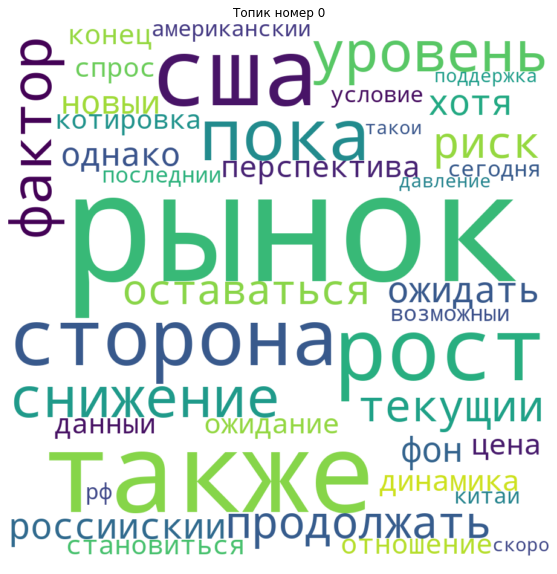

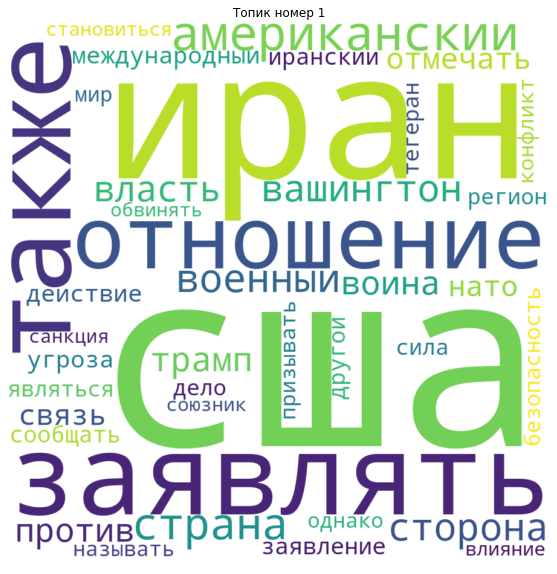

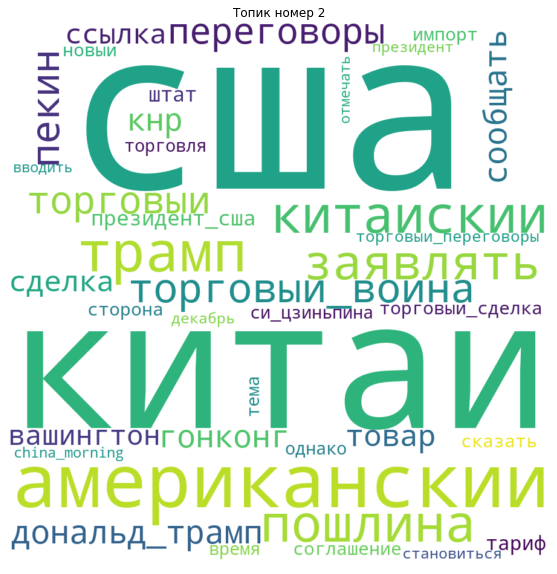

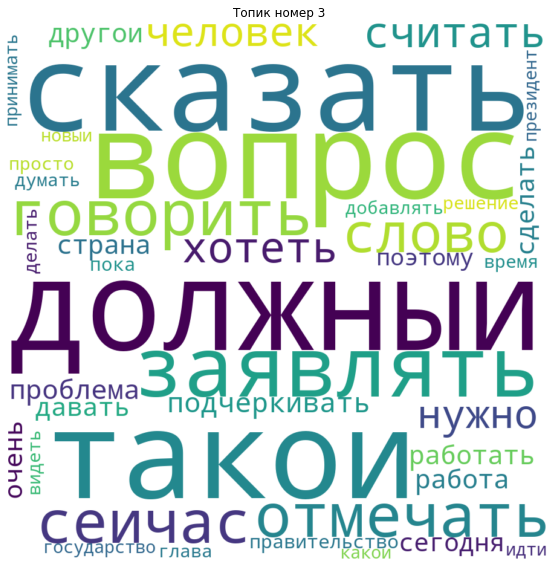

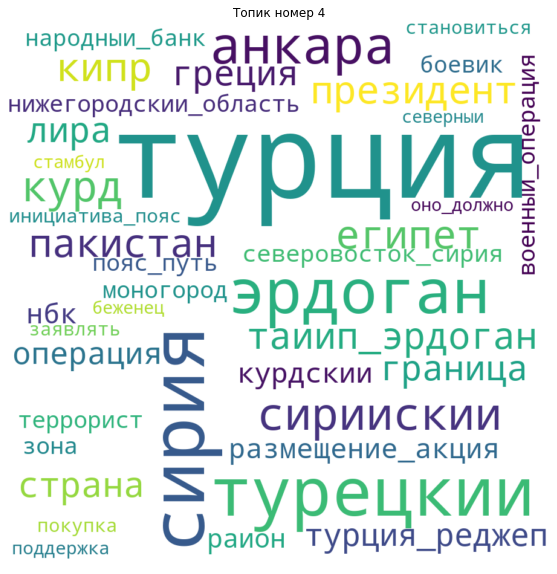

In [54]:
for i in range(5):
    plotWordCloud(i)


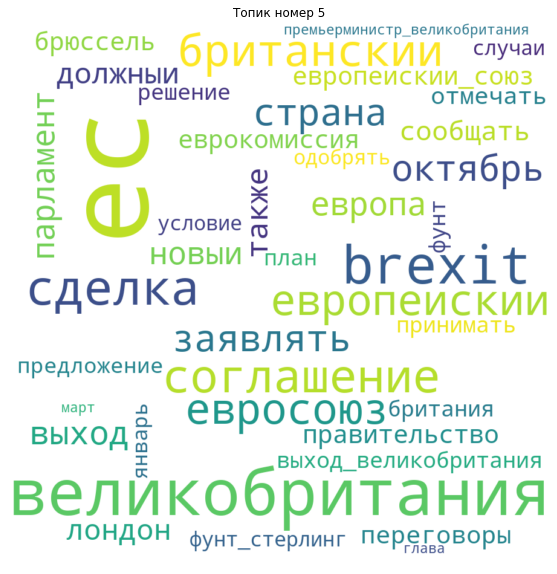

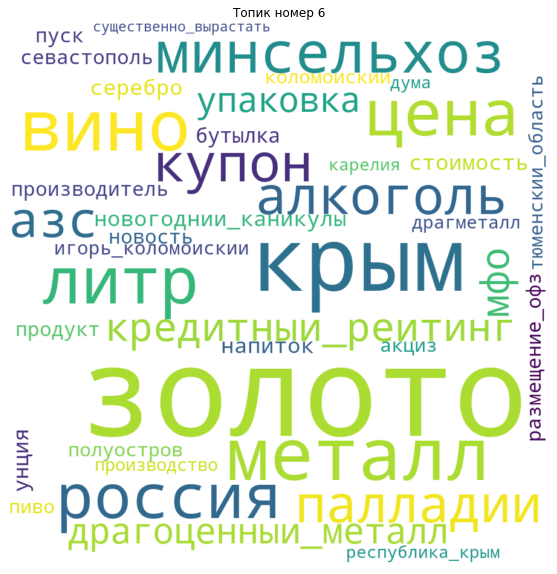

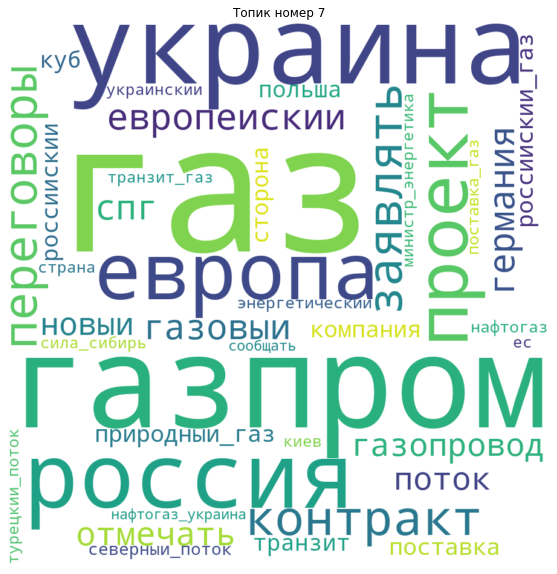

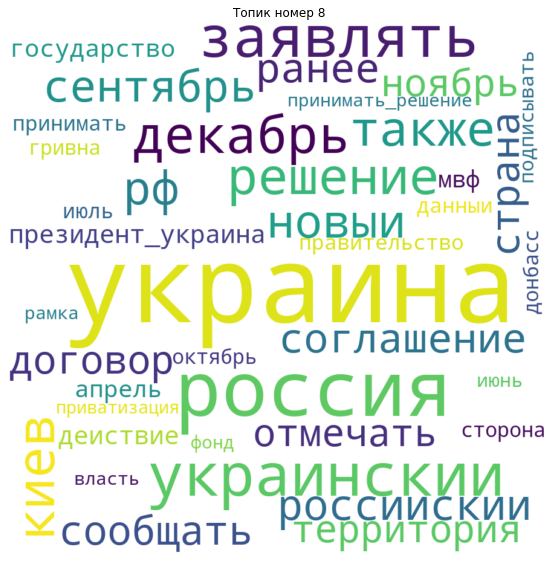

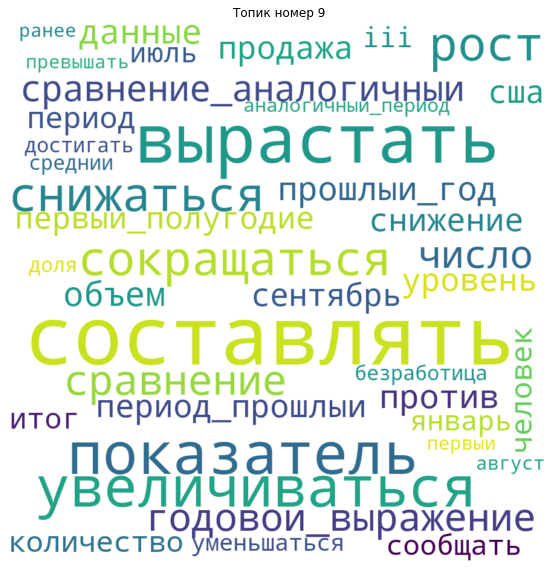

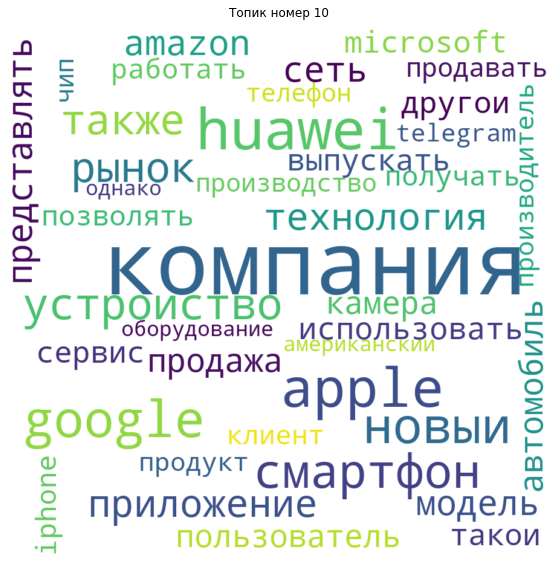

In [55]:
for i in range(5, 11):
    plotWordCloud(i)
    

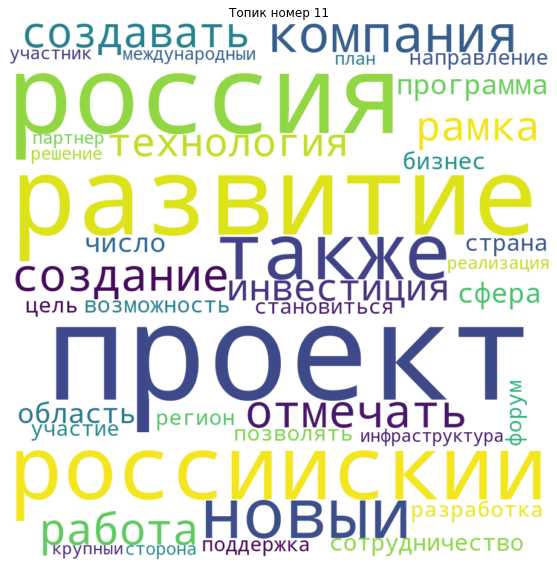

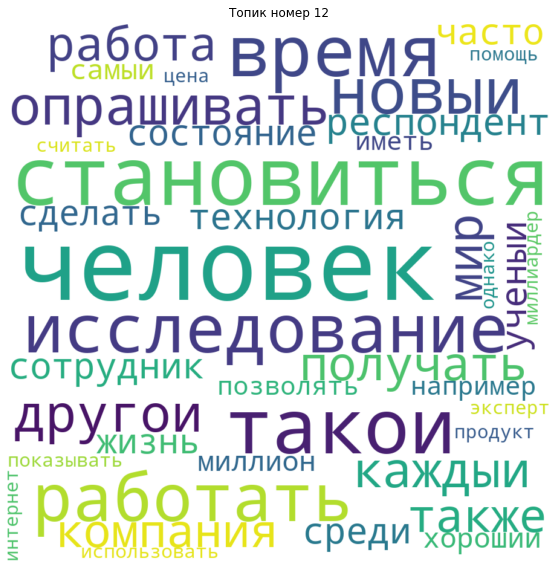

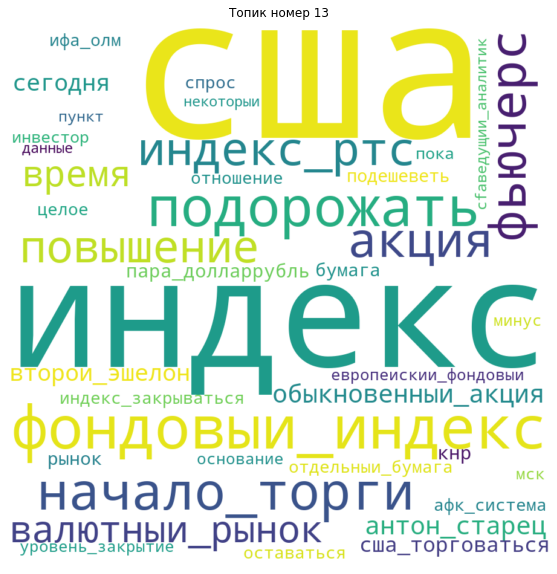

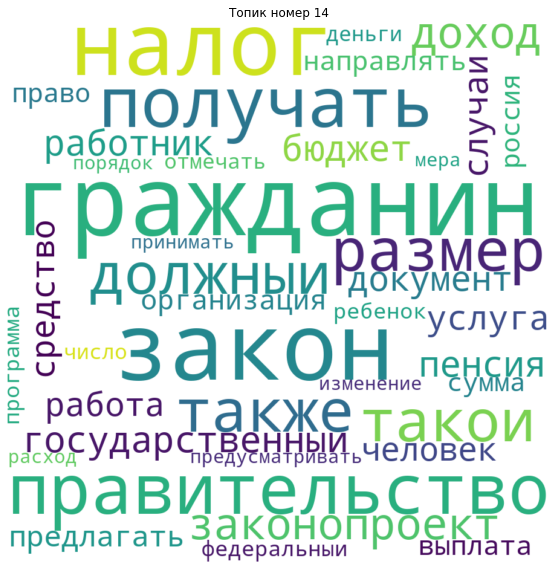

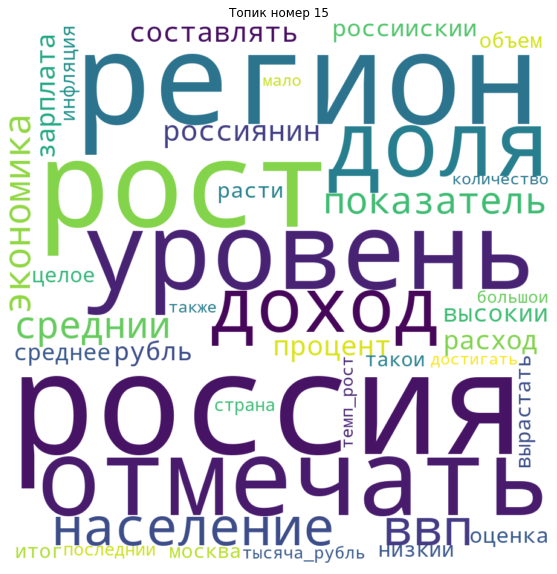

In [56]:
for i in range(11, 16):
    plotWordCloud(i)
    

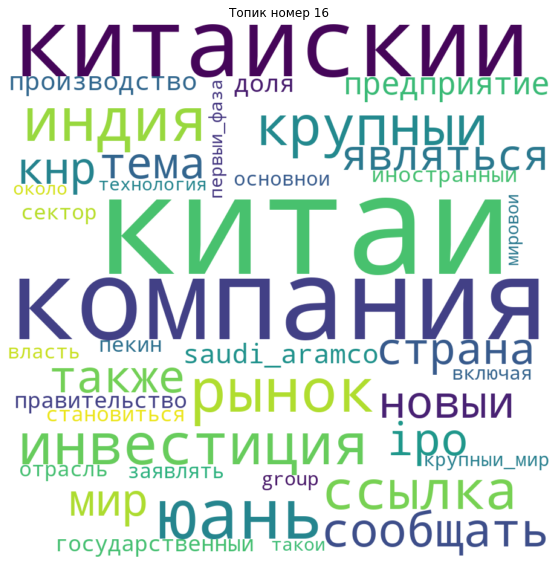

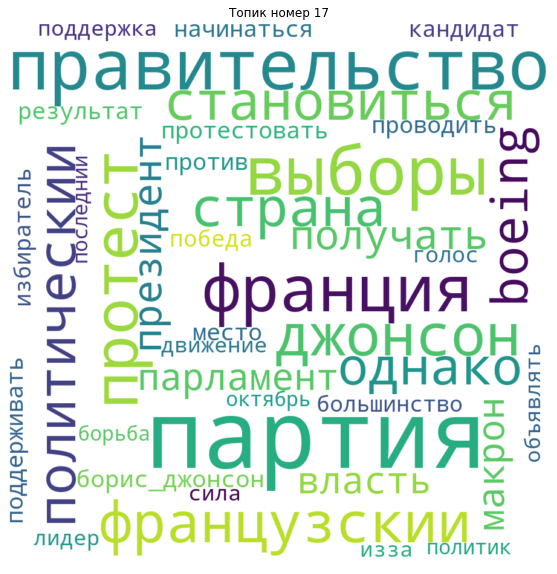

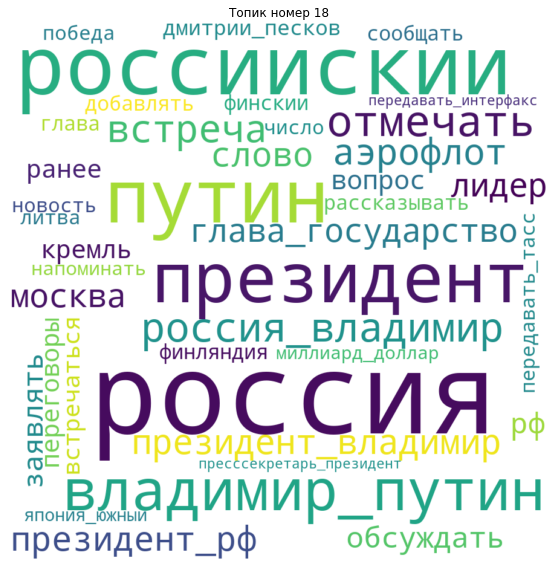

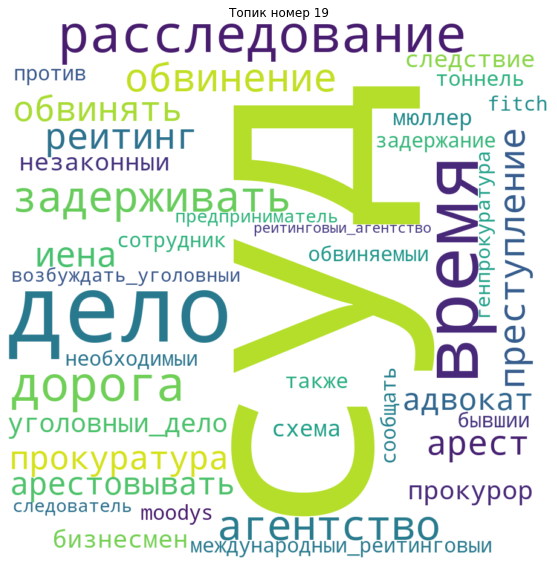

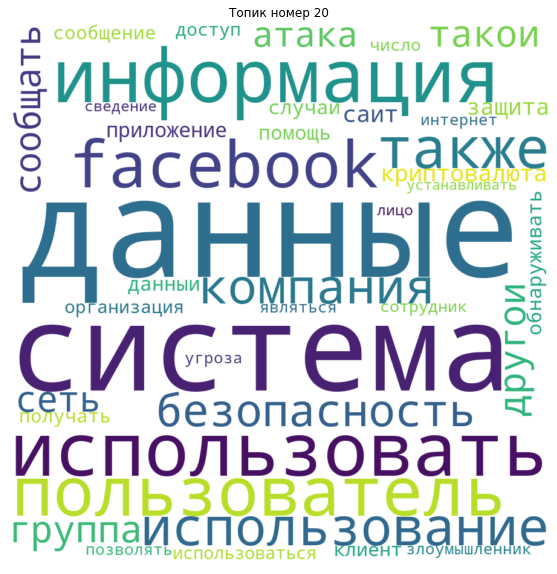

In [57]:
for i in range(16, 21):
    plotWordCloud(i)
    

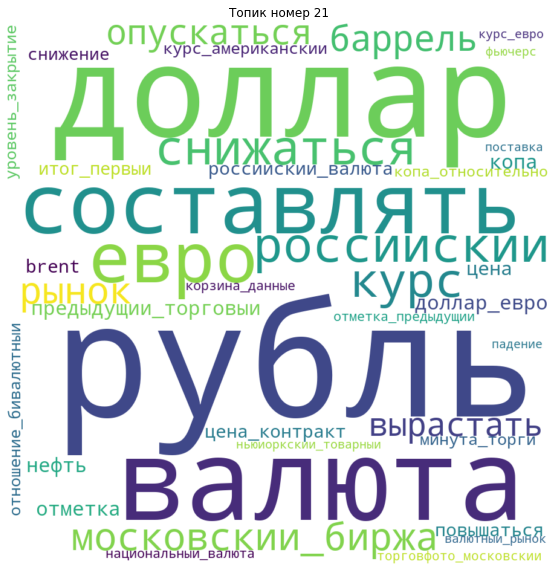

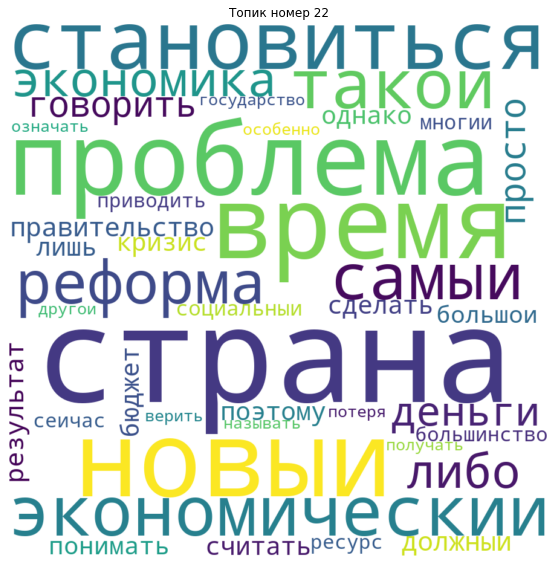

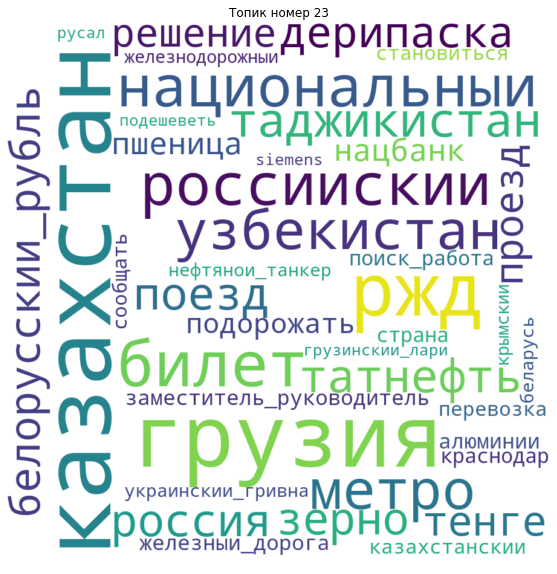

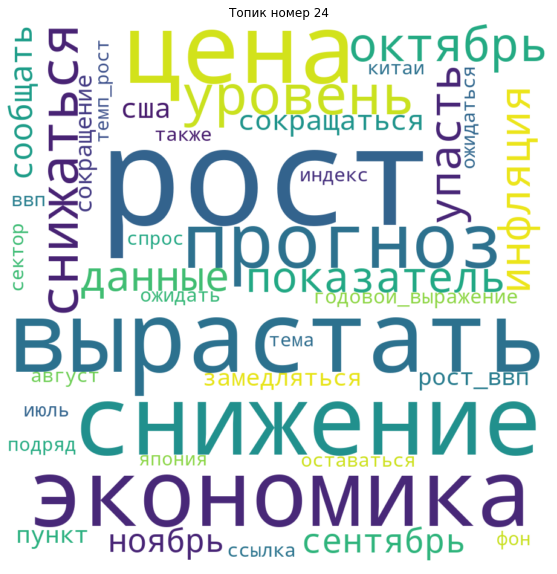

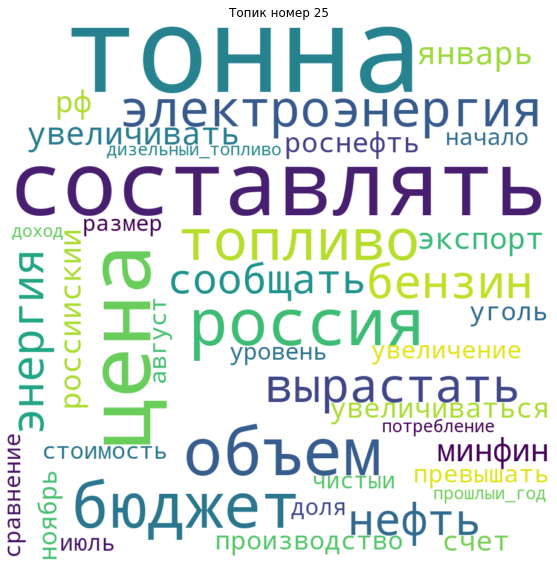

In [58]:
for i in range(21, 26):
    plotWordCloud(i)
    

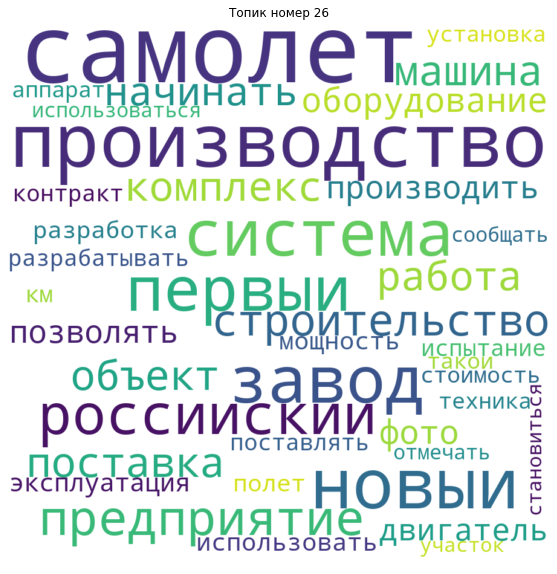

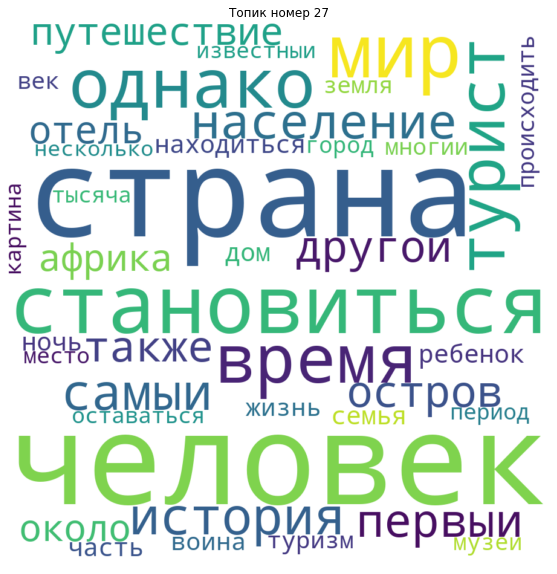

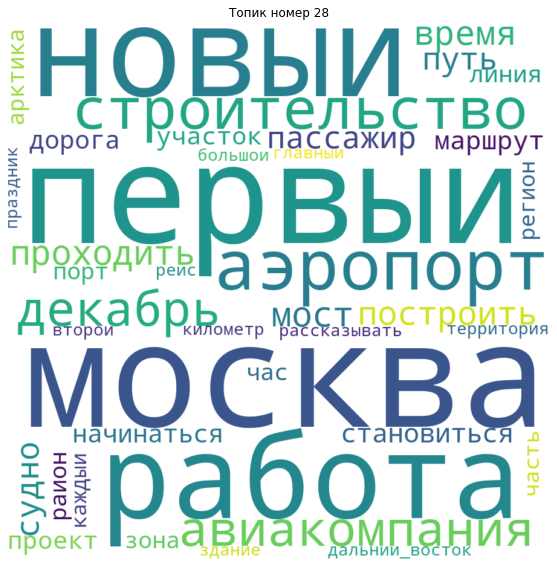

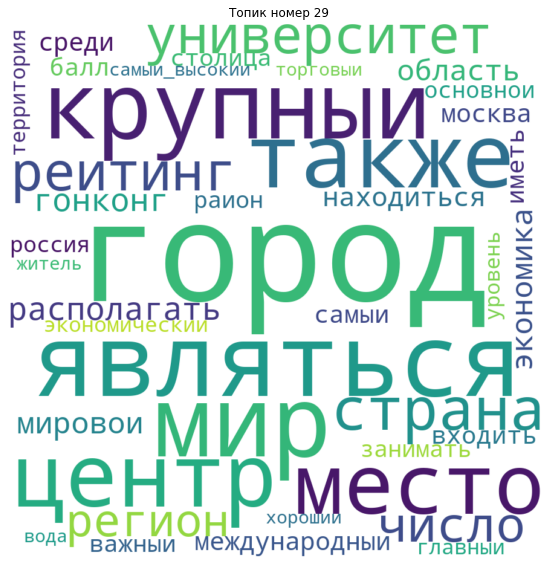

In [59]:
for i in range(26, 30):
    plotWordCloud(i)
    

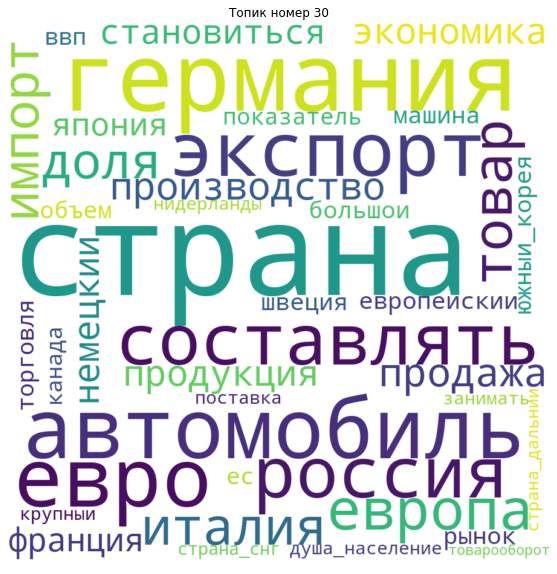

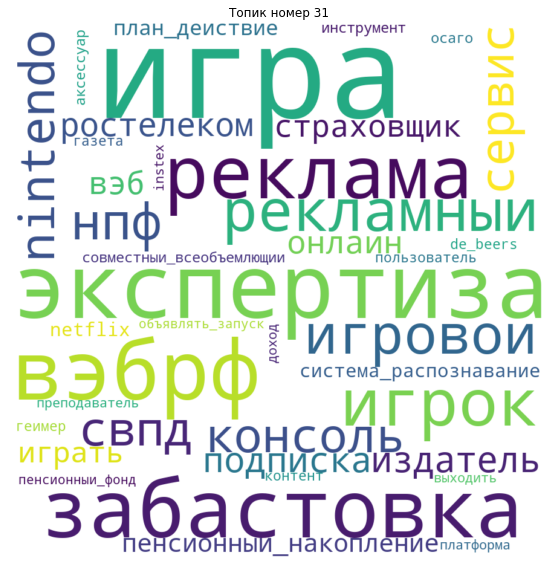

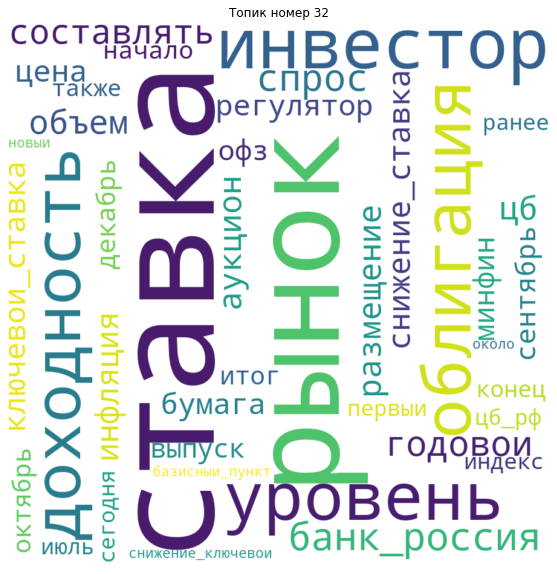

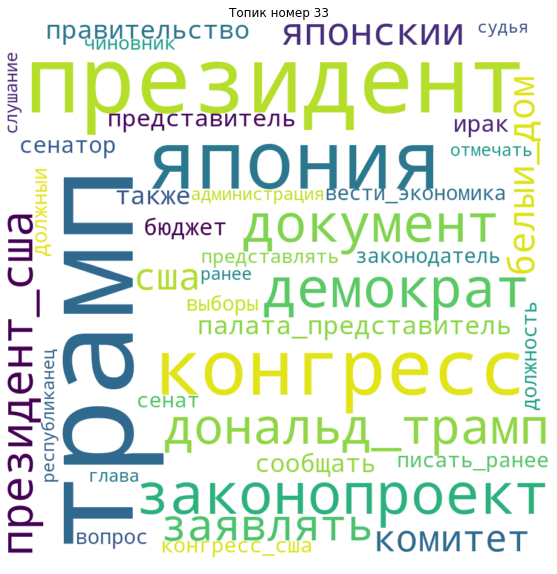

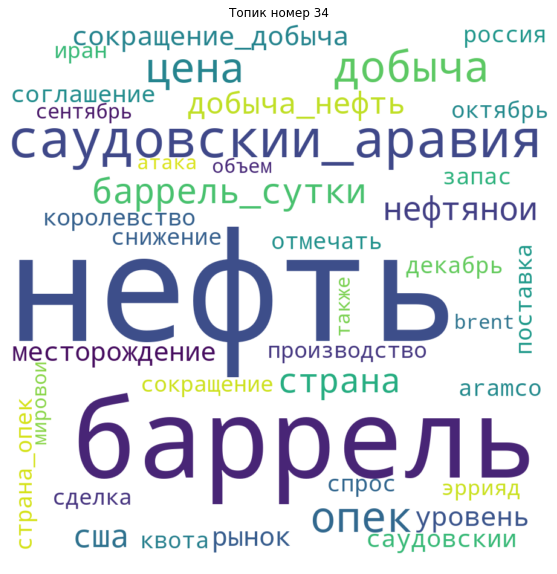

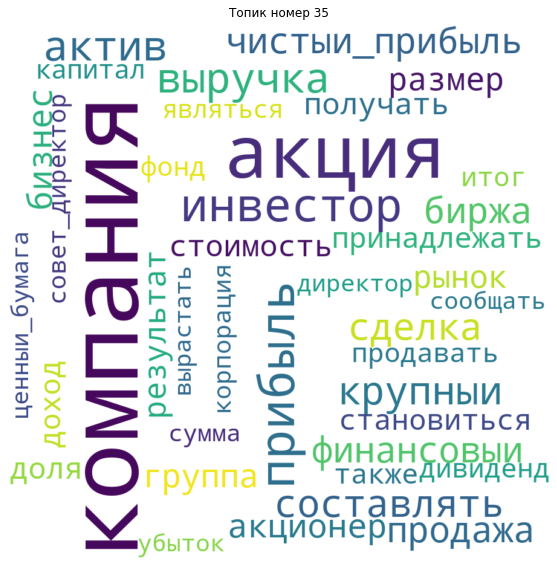

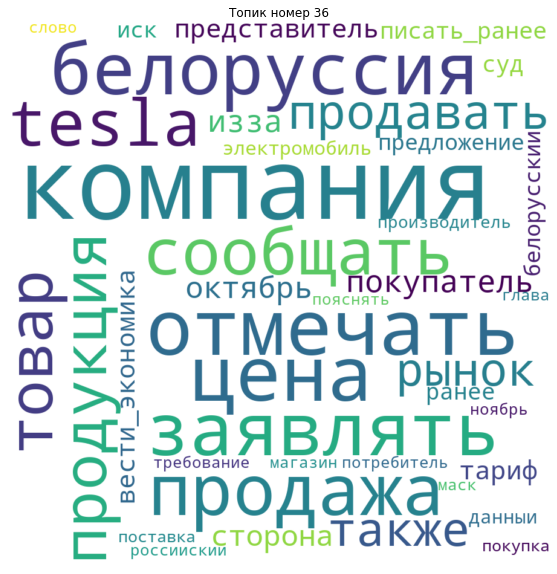

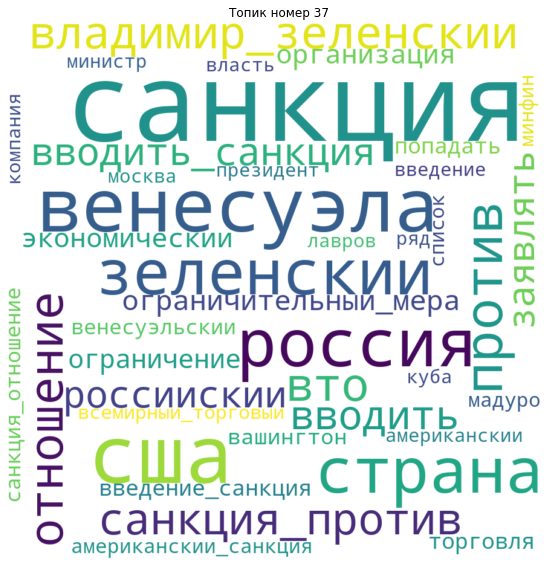

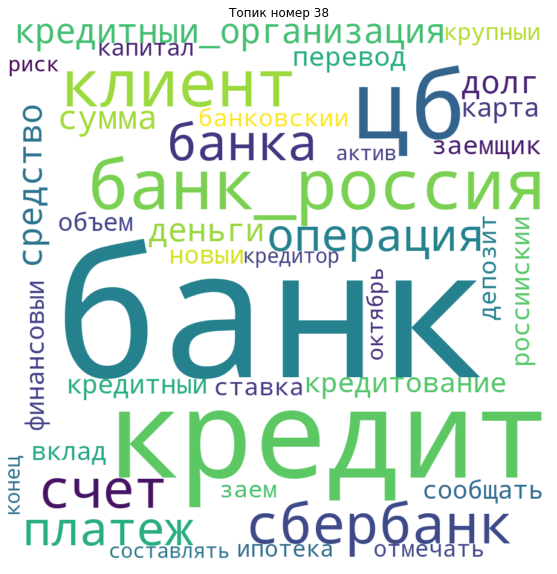

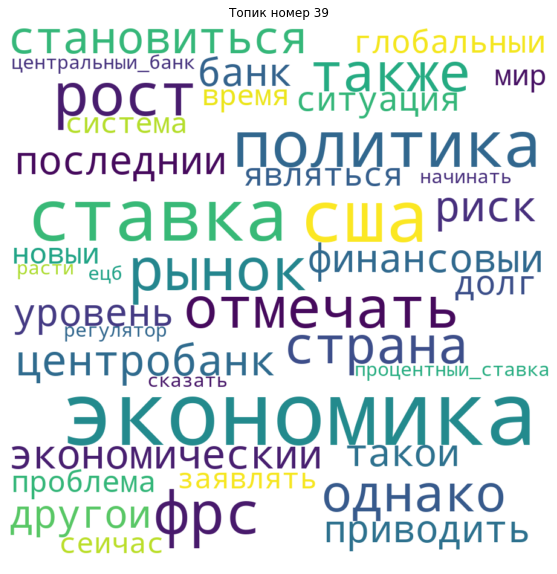

In [60]:
for i in range(30, 40):
    plotWordCloud(i)


In [63]:
# Не идеально, но очень много четко выделяемых топиков. К 'неинтерпретируемым' я отнес лишь 2 топика.
# Есть несколько достаточно близких по теме наборов слов.


In [71]:
themes_40 = {
    0: 'Рынок США',
    1: 'отношения США и Ирана',
    2: 'торговая война США и Китая',
    3: 'неинтерпретируемая',
    4: 'Турция и Сирия',
    5: 'Brexit',
    6: 'Крым',
    7: 'Украина, Газ',
    8: 'Отношения РФ и Украины',
    9: 'Глаголы про продажи',
    10: 'Технические компании',
    11: 'Развитие и проекты РФ',
    12: 'Исследования и человек',
    13: 'Индексы, США',
    14: 'Налоги и законы России',
    15: 'Рост, ВВП и уровень дохода РФ',
    16: 'Рынок IPO компаний',
    17: 'Выборы и политика',
    18: 'Путин',
    19: 'Суд, расследования',
    20: 'Безопасность данных. Facebook',
    21: 'Валюты, курсы',
    22: 'Экономические проблемы и реформы',
    23: 'Страны СНГ и товары торговли между ними',
    24: 'Экономика, рост и снижение',
    25: 'Топливо в РФ: цены, объемы и т.д.',
    26: 'Заводы РФ',
    27: 'Страна, человек, турист',
    28: 'Новости про аэропорты Москвы',
    29: 'Город, территория, университет',
    30: 'Импорт/экспорт, автомобили, Германия', 
    31: 'Рекламный рынок',
    32: 'Облигации, доходность',
    33: 'Трамп, Конгресс, Япония',
    34: 'Нефть, Саудовская Аравия',
    35: 'Акции, прибыль',
    36: 'неинтерпретируемая',
    37: 'Санкции, Венесуэла',
    38: 'О политики банков',
    39: 'Ставка ФРС',
}

In [77]:
topics[0]


(0,
 [('рынок', 0.035126265),
  ('также', 0.01622326),
  ('сша', 0.011129843),
  ('рост', 0.009727786),
  ('сторона', 0.00953442),
  ('пока', 0.007919141),
  ('уровень', 0.007877092),
  ('снижение', 0.007770202),
  ('фактор', 0.00772934),
  ('продолжать', 0.0061829253),
  ('текущии', 0.006145456),
  ('риск', 0.0060749464),
  ('оставаться', 0.0060747433),
  ('россиискии', 0.0060153008),
  ('ожидать', 0.0060005435),
  ('хотя', 0.005791702),
  ('фон', 0.0054482985),
  ('новыи', 0.005046012),
  ('однако', 0.005011166),
  ('перспектива', 0.00500322),
  ('цена', 0.004856303),
  ('динамика', 0.004817764),
  ('ожидание', 0.0044621374),
  ('данныи', 0.004336904),
  ('отношение', 0.0042942283),
  ('конец', 0.0042722626),
  ('становиться', 0.004125437),
  ('котировка', 0.004035021),
  ('спрос', 0.0039852047),
  ('американскии', 0.003965376),
  ('возможныи', 0.0039270576),
  ('сегодня', 0.003864007),
  ('условие', 0.0038321693),
  ('последнии', 0.003741872),
  ('китаи', 0.0037290417),
  ('рф', 0.0

# Профили по месяцам

In [114]:
# Профили групп я решил объединить по месяцам. Чтобы посмотреть в какой месяц какая тема была актуальней.


In [96]:
def topicProfileGenre(model, month, dataset, corpus):

    # Тут будем хранить результат
    theme_results = [ ]

    # Какое в модели количество топиков
    r = model.num_topics
    
    # Выбираем из таблицы те строки, которые соовтетствуют текущему месяцу
    num = dataset[dataset['month'] == month].index.get_values() 
   

    # Вектор для тематического профиля жанра
    theme_profile = np.zeros(r)
    err = 0 # Для записи ошибок

    # Пробежимся по всем любителям текущего жанра
    for i in num:
        try:
            # вытаскиваем тематический профиль текущего юзера
            cur_user_prof = model.get_document_topics(corpus[i])

            # сортируем по номерам тем
            cur_user_prof = sorted(cur_user_prof, key = lambda w: w[0], reverse = True)

            ind = [cup[0] for cup in cur_user_prof]     # делаем вектор с номерами тем
            prob = np.array([cup[1] for cup in cur_user_prof]) # делаем вектор с весами  
            theme_profile[ind] += prob        # Увеличиваем соответствующие веса
        except:
            err += 1 # Если возникла ошибка, значит профиль битый 

    # Нормируем к единице
    #print('Доля битых профилей для {}:'.format(music_style), err/len(num))
    theme_profile = theme_profile / np.sum(theme_profile)
    theme_profile = list(zip(range(30),theme_profile))
    return theme_profile


In [97]:
# data['month'].values.tolist()

In [98]:
%%time
months = { }
for month in data['month'].unique():
    theme = topicProfileGenre(ldamodel, month, data, corpus)
    months[month] = theme


/Users/oleg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
  # Remove the CWD from sys.path while we load stuff.


In [101]:
def profilePlot(theme_profile, month, themes = themes_40):
    
    theme_profile = theme_profile[month]
    sorted_prof = sorted(theme_profile, key = lambda w: w[1], reverse = True)   
    
    sns.set(font_scale=2)
    plt.subplots(figsize=(30, 40))
    
    prof = np.array([pr[1] for pr in sorted_prof]).reshape(1,-1)
    them = [themes[pr[0]] for pr in sorted_prof]
    
    ax = plt.axes()    
    sns.heatmap(prof, ax = ax, square = True, annot = True, fmt = ".2f", linewidths = 0.1, 
                 cmap = "YlGnBu", cbar = False, yticklabels = '', xticklabels = them )
    ax.set_title('Тематический профиль для {}: \n'.format(month))
    plt.show()
    

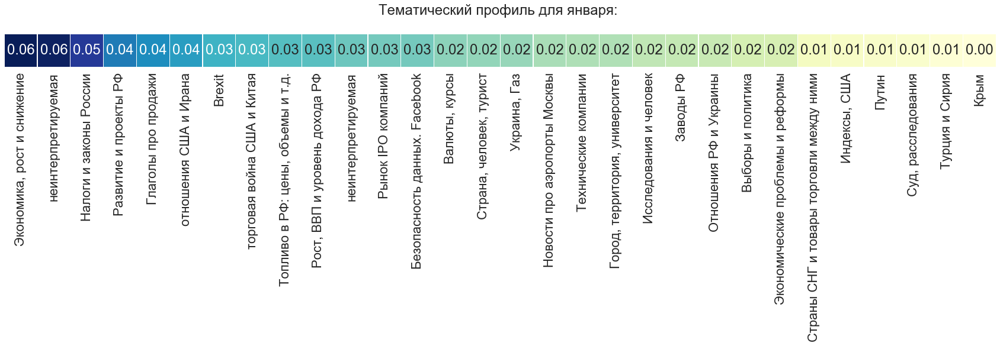

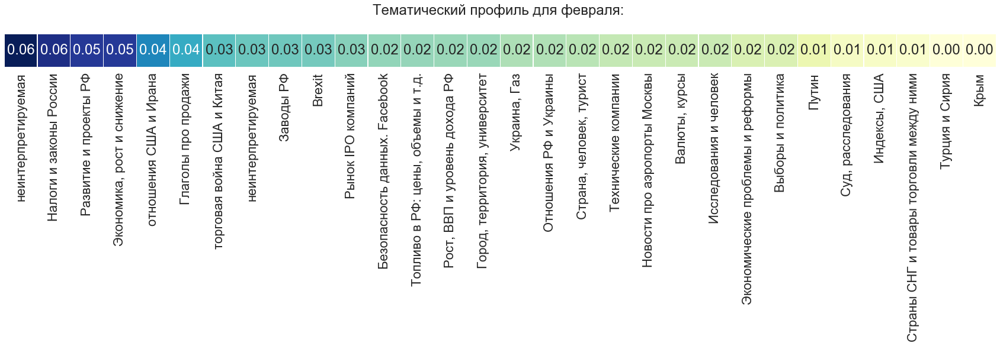

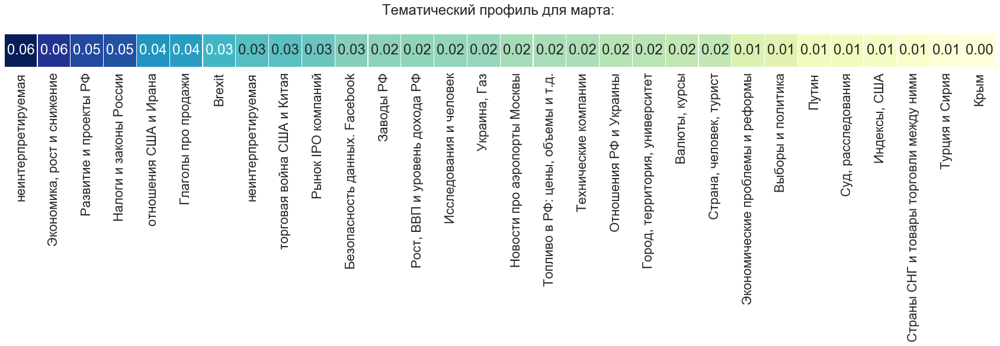

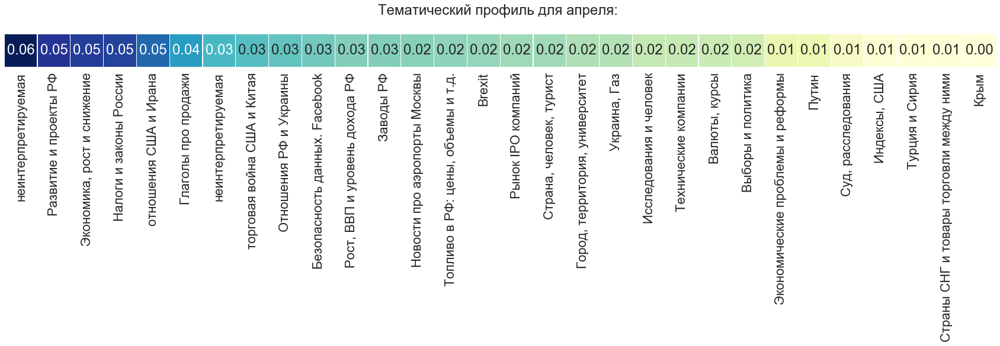

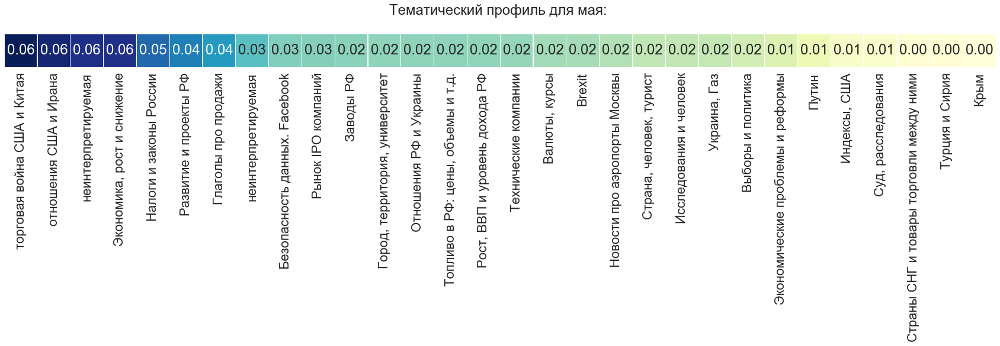

...

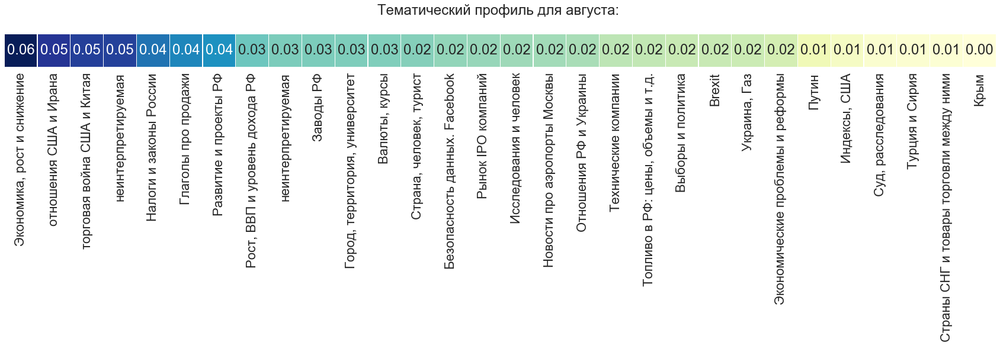

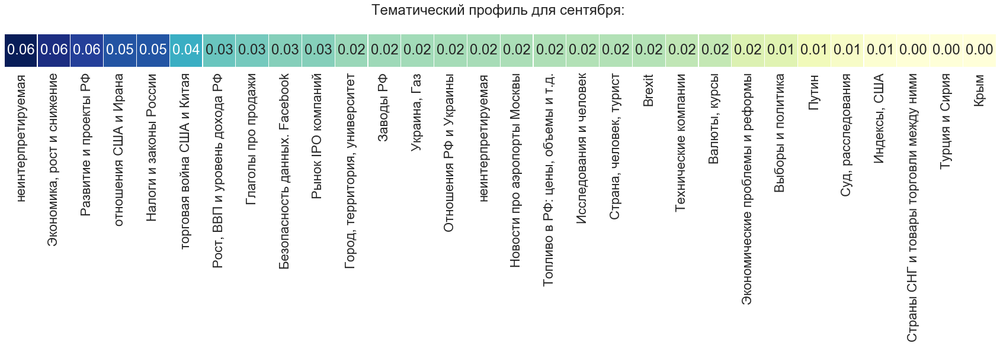

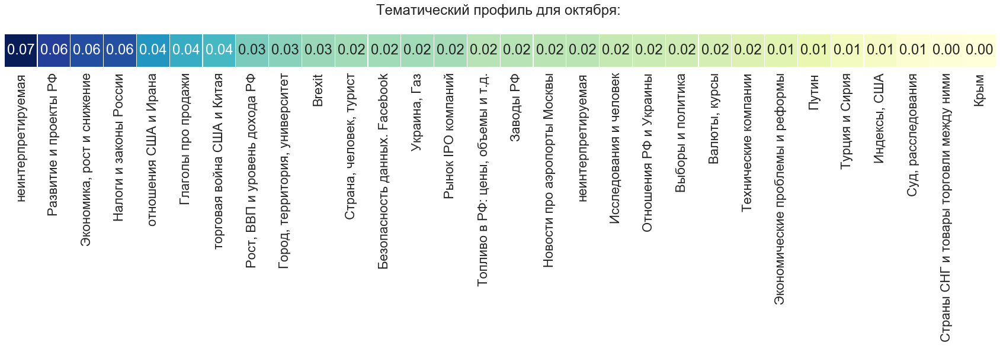

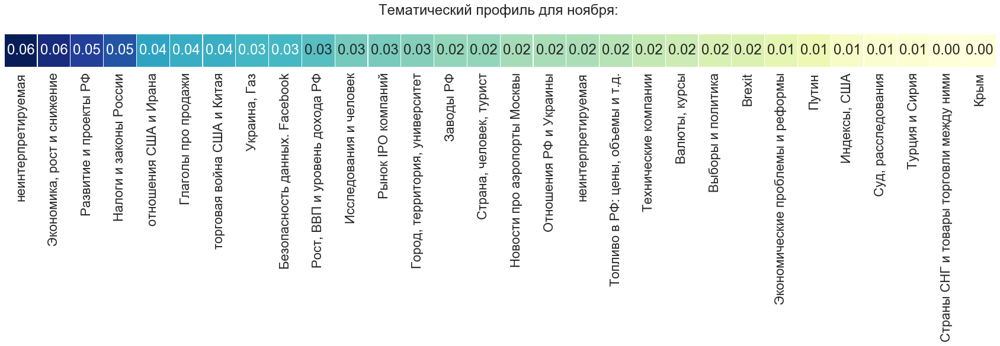

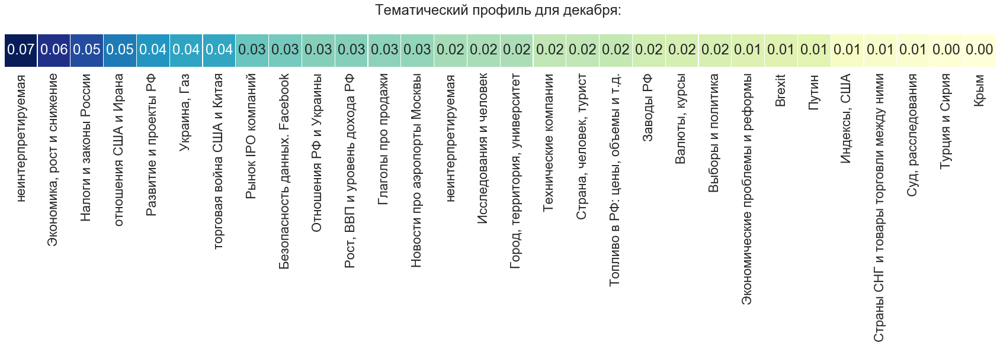

In [104]:
for month in data['month'].unique():
    profilePlot(months, month)


In [108]:
def get_interpretable_topics(topics, interpretation):
    topics_clean = {}
    
    for key, value in topics.items():
        clean_topics = []
        clean_probs = []
        for topic, prob in value:
            if themes_40[topic]!="неинтерпретируемая":
                clean_topics.append(topic)
                clean_probs.append(prob)

        clean_probs = np.array(clean_probs)/np.sum(clean_probs)

        topics_clean[key] = list(zip(clean_topics, clean_probs))
        
    return topics_clean


In [109]:
months_themes_clean = get_interpretable_topics(months, themes_40)


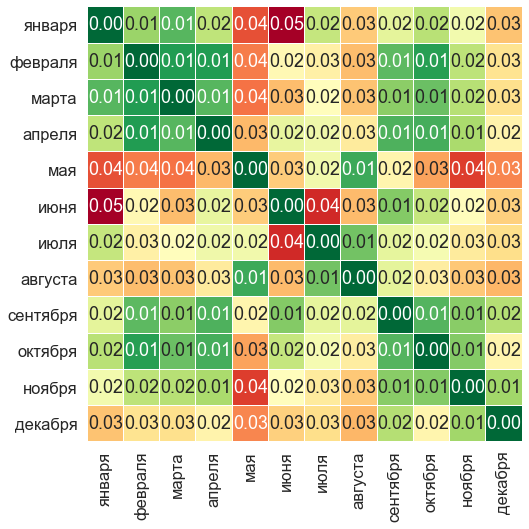

In [113]:
from scipy.spatial.distance import cosine
months_style = list(months_themes_clean.keys())
n = len(music_style)
R = np.zeros((n,n))

for i in range(n):
    can_1 = [item[1] for item in months_themes_clean[months_style[i]]]
    for j in range(n):
        can_2 = [item[1] for item in months_themes_clean[months_style[j]]]
        R[i,j] = cosine(can_1, can_2)
            
sns.set(font_scale = 1.5)
plt.subplots(figsize = (8, 8))
sns.heatmap(R, square = True,
            annot = True, fmt = ".2f", linewidths = 0.1, cmap = "RdYlGn_r",
            yticklabels = months_style, xticklabels = months_style, cbar = False);


In [136]:
# Видим достоточно близкие вектора у января с февралем, мартом
# февраль, март, апрель с сентябрем, октябрем и ноябрем и т.д.


# t-SNE 

In [119]:
month_themes_clusters = {}
for k, v in months_themes_clean.items():
    month_themes_clusters[k] = [prob[1] for prob in v]
    
month_themes_clusters = pd.DataFrame(month_themes_clusters).T


In [122]:
tsne = MulticoreTSNE()
tsne_features = tsne.fit_transform(month_themes_clusters)


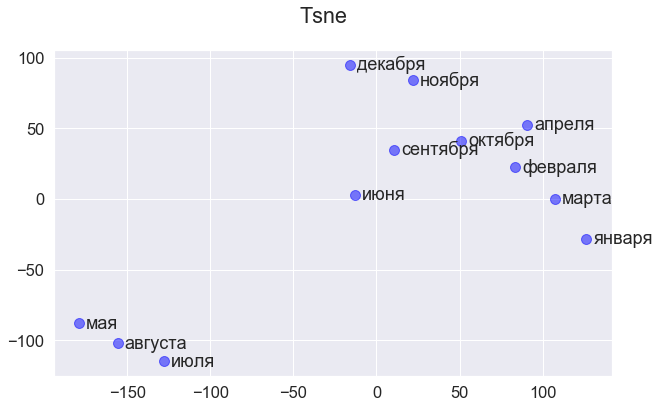

In [152]:
x = tsne_features[:, 0]
y = tsne_features[:, 1]
labels = month_themes_clusters.index

# Create the figure and axes objects
fig, ax = plt.subplots(1, figsize = (10, 6))
fig.suptitle('Tsne')

# Plot the scatter points
ax.scatter(x, y, color = "blue", s = 100, alpha = 0.5, linewidths = 1)

for x_pos, y_pos, label in zip(x, y, labels):
    ax.annotate(label, xy = (x_pos, y_pos), xytext = (7, 0),
                textcoords = 'offset points', ha = 'left', va = 'center')

plt.show()


In [153]:
# t-SNE неплохо показывает близость месяцов, вектора которых были близки на матрице корреляций
